In [1]:
from BusNetPynew.buspider import buspi

# 初始化采集器
spider = buspi(
    province='上海市',
    city='杨浦区',
    key='179a4a2d236577f4f456d3930589fa99',
    key_fwd='0da398a96a589d5c4c11938267851e63',
    jscode='b740278d01cb70b90faac93ceac851e1',
    keyword='公交',
    region_xzq=['上海市', '杨浦区']  # 行政区划方式
)

# 执行采集，返回站点和线路 GeoDataFrame
bus_stops, bus_lines = spider.businfo(save_path='./data/')

d:\program\miniconda\envs\traffic\lib\site-packages\fuzzywuzzy\fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')
正在获取杨浦区公交线路数据: 100%|██████████| 117/117 [01:24<00:00,  1.39it/s]


In [12]:
bus_stops

,城市,站点名称,lng,lat,id,name,正反线路,geometry
0,杨浦区,彭浦新村(景凤路),121.452291,31.321486,BV10030368,597路(彭浦新村(景凤路)--东方路张杨路),1,POINT (121.45229 31.32149)
1,杨浦区,岭南路景凤路,121.451301,31.319713,BV10024657,597路(彭浦新村(景凤路)--东方路张杨路),1,POINT (121.4513 31.31971)
2,杨浦区,阳曲路保德路,121.455375,31.318030,BV10029862,597路(彭浦新村(景凤路)--东方路张杨路),1,POINT (121.45538 31.31803)
3,杨浦区,阳曲路临汾路,121.455389,31.313454,BV10026046,597路(彭浦新村(景凤路)--东方路张杨路),1,POINT (121.45539 31.31345)
4,杨浦区,阳曲路场中路,121.455538,31.308555,BV10026045,597路(彭浦新村(景凤路)--东方路张杨路),1,POINT (121.45554 31.30856)
...,...,...,...,...,...,...,...,...
4185,杨浦区,杨树浦路松潘路,121.539036,31.262864,BV10024884,135路(老西门--杨树浦路黎平路),2,POINT (121.53904 31.26286)
4186,杨浦区,杨树浦路临青路,121.541444,31.265173,BV10024885,135路(老西门--杨树浦路黎平路),2,POINT (121.54144 31.26517)
4187,杨浦区,杨树浦路隆昌路,121.548106,31.270290,BV10024886,135路(老西门--杨树浦路黎平路),2,POINT (121.54811 31.27029)
4188,杨浦区,杨树浦路内江路,121.550808,31.272200,BV10024887,135路(老西门--杨树浦路黎平路),2,POINT (121.55081 31.2722)


In [6]:
from BusNetPynew.busbuild import read_busdata, build_route

# 读取 CSV 数据
df_line, df_point = read_busdata(
    path_line='data\上海市\csv\杨浦区公交线路.csv',
    path_point='data\上海市\csv\杨浦区公交站点.csv'
)

# 构建结构化线网（默认投影 EPSG:3857，输出转回 WGS84）
gdf_route = build_route(df_line, df_point, epsg=3857, wgs84=True)

In [7]:
from BusNetPynew.metrical import spaceL, spacep

# Space-L 网络（相邻站点连接）
G_L, pos = spaceL(gdf_route)

# Space-P 网络（同线路站点全连接）
G_P = spacep(df_point, gdf_route)

In [8]:
from BusNetPynew.metrical import Nonline, avg_station, cf_all, unique_line, most_linesta

# 非直线系数
base_line, cycle_line, fzxxs_base, fzxxs_hx = Nonline(
    gdf_route, base_path='非环线.csv', hx_path='环线.csv'
)

# 平均站间距
avg_sta = avg_station(gdf_route, file_path='平均站间距.csv')

# 重复系数
cf = cf_all(G_L, gdf_route)

# 最大共线边
max_lines = unique_line(G_L)

# 最多线路站点
most_linesta(G_L)

'五角场(淞沪路)'

In [19]:
from BusNetPynew.metrical import find_nearest_node
from BusNetPynew.routplaning import bus_route_planning

# 查找最近站点
node1, name1, dist1 = find_nearest_node(G_L, lng=121.452291, lat=31.321486)	
node2, name2, dist2 = find_nearest_node(G_L, lng=113.02, lat=28.19)

# 公交路径规划
stations, path_gdf, length = bus_route_planning(G_P, G_L, node1, node2, gdf_route)
stations, path_gdf, length

(['彭浦新村(景凤路)', '阳曲路场中路', '五角场(淞沪路)', '国康路四平路', '曹安公路绿苑路'],
    stationname nt_stationname  \
 0       阳曲路保德路      彭浦新村(景凤路)   
 1       阳曲路临汾路         阳曲路保德路   
 2       阳曲路场中路         阳曲路临汾路   
 3      场中路江杨南路         阳曲路场中路   
 4      场中路新市北路        场中路江杨南路   
 5      江湾(逸仙路)        场中路新市北路   
 6     大柏树(逸仙路)        江湾(逸仙路)   
 7       邯郸路运光路       大柏树(逸仙路)   
 8         复旦大学         邯郸路运光路   
 9     五角场(邯郸路)           复旦大学   
 10    五角场(淞沪路)       五角场(邯郸路)   
 11      四平路国定路       五角场(淞沪路)   
 12      四平路国权路         四平路国定路   
 13      国康路四平路         四平路国权路   
 14      国康路四平路         曹杨路兰溪路   
 15      曹杨路兰溪路           曹杨八村   
 16        曹杨八村           真如西村   
 17        真如西村             封浜   
 18          封浜        曹安公路绿苑路   
 
                                              geometry  
 0   LINESTRING (121.45539 31.31848, 121.45539 31.3...  
 1   LINESTRING (121.45538 31.31166, 121.45538 31.3...  
 2   LINESTRING (121.45549 31.30901, 121.45548 31.3...  
 3   LINESTRING (121.46151 31.3

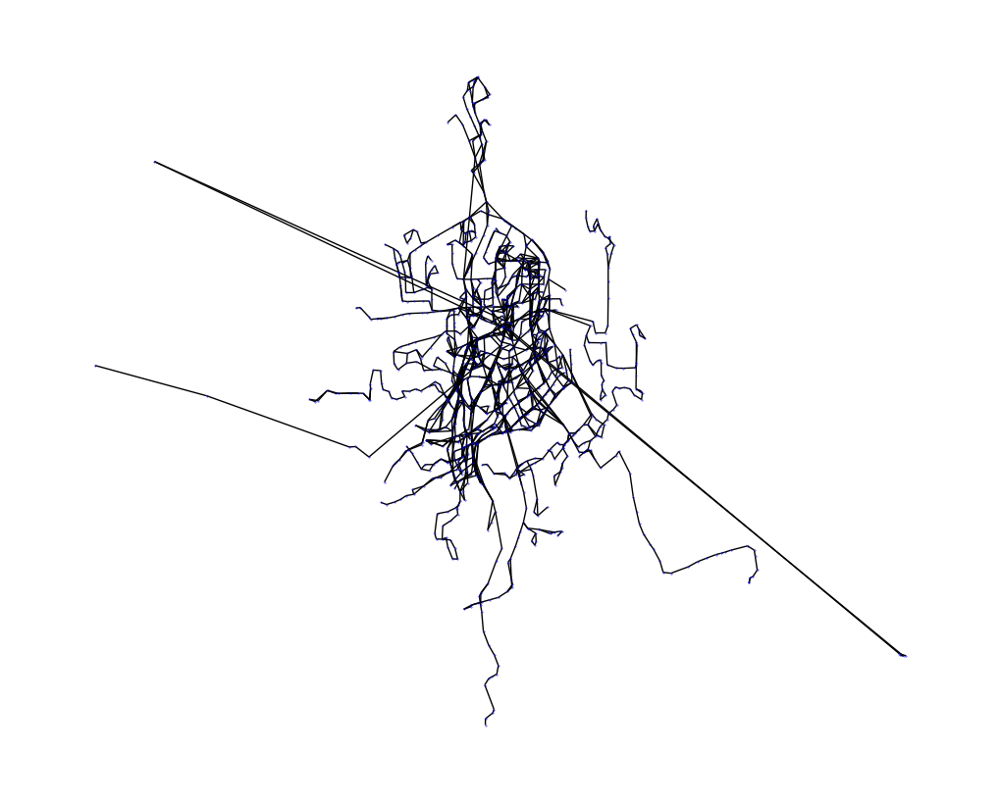

In [ ]:
from BusNetPynew.csvis import ksh_point, ksh_line, ksh_all
from BusNetPynew.metrical import G_ksh

# 静态网络图
G_ksh(G_L, pos)

# 交互式地图
ksh_line(gdf_route, columns_name='name')  # 线路图
ksh_point(bus_stops)                        # 站点图
ksh_all(bus_stops, gdf_route)              # 叠加图